In [66]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from PIL.ExifTags import TAGS

In [67]:
def plot_grid_images(samples, how_many = 20):
    def display_image(ax, image, label):
        ax.set_title(
            f"Label: {label}", 
            fontsize = 10, color = 'red'
        )

        ax.imshow(image)
        ax.set_xticks([])
        ax.set_yticks([])
        
    how_many = how_many * 3
    last = (samples.shape[0] // 3) * 3
    f, axarr  = plt.subplots(1, 3, figsize = (16, 16))
    for row, sample in samples.iterrows():
        image = Image.open(sample['path'])
        image = image.resize((456, 456))

        axis       = None
        label      = sample['label']

        if row % 3 == 0:
            axis = axarr[0]

        if row % 3 == 1:
            axis = axarr[1]

        if row % 3 == 2:
            axis = axarr[2]

        display_image(axis, image, label)

        if row == how_many: break

        if row != 0 and row % 3 == 0:
            plt.show()
            f, axarr = plt.subplots(1, 3, figsize = (16, 16))

        if row == last: break

In [68]:
PATH_TO_BASE  = '../data/detect-targets-in-radar-signals/'
PATH_TO_TRAIN = os.path.join(PATH_TO_BASE, 'train.csv')
PATH_TO_TEST  = os.path.join(PATH_TO_BASE, 'test.csv')

PATH_TO_TRAIN_IMAGES = os.path.join(PATH_TO_BASE, 'train', '*.png')
PATH_TO_TEST_IMAGES  = os.path.join(PATH_TO_BASE, 'test',  '*.png')

In [69]:
train_df = pd.read_csv(PATH_TO_TRAIN)
train_df['path'] = train_df['id'].apply(lambda x: os.path.join(PATH_TO_BASE, 'train', x))
display(train_df)

test_df = pd.read_csv(PATH_TO_TEST)
test_df['path'] = train_df['id'].apply(lambda x: os.path.join(PATH_TO_BASE, 'train', x))
display(test_df)

,id,label,path
0,ae36b992-7c8d-42c6-851f-51aca56285ec.png,1,../data/detect-targets-in-radar-signals/train/...
1,09c10b66-6d7e-4688-aa26-42b75cf5e1e9.png,1,../data/detect-targets-in-radar-signals/train/...
2,da6684f7-aabb-49e6-8bb0-c4e048e2dbba.png,2,../data/detect-targets-in-radar-signals/train/...
3,032dd82e-8776-476c-8d80-8e67d1d4909f.png,5,../data/detect-targets-in-radar-signals/train/...
4,e0a6d04b-18fa-4b15-89e2-6cb74fbcf437.png,2,../data/detect-targets-in-radar-signals/train/...
...,...,...,...
15495,b0b08f42-83f2-424d-bf29-85a1e55606fd.png,1,../data/detect-targets-in-radar-signals/train/...
15496,05bb64ec-cc16-4260-ad37-de5c4139ae39.png,4,../data/detect-targets-in-radar-signals/train/...
15497,f3417069-c8b0-4a59-a834-4f44932eab30.png,5,../data/detect-targets-in-radar-signals/train/...
15498,c65d1b1c-2c52-4c79-8b04-068798fa6734.png,3,../data/detect-targets-in-radar-signals/train/...


,id,path
0,a5ce7900-4a92-4969-887b-882515678aaa.png,../data/detect-targets-in-radar-signals/train/...
1,afac9315-be6d-49de-a02b-56ab6de79285.png,../data/detect-targets-in-radar-signals/train/...
2,225ea6a6-6e0a-4c9b-b2ac-8ca32c9fa598.png,../data/detect-targets-in-radar-signals/train/...
3,e5fbafa1-58c6-4aea-a3d5-3910483ef377.png,../data/detect-targets-in-radar-signals/train/...
4,c3dff3c1-df96-47bc-a41d-be05eadaf701.png,../data/detect-targets-in-radar-signals/train/...
...,...,...
5495,cecd691e-478a-427a-9ca4-600e63749570.png,../data/detect-targets-in-radar-signals/train/...
5496,07037c6c-115d-4ca0-98e0-61c095c14188.png,../data/detect-targets-in-radar-signals/train/...
5497,66ba6865-379e-4429-a271-1d38b964b066.png,../data/detect-targets-in-radar-signals/train/...
5498,84ba943b-6b34-4b7f-a9d5-ebf667edcc1a.png,../data/detect-targets-in-radar-signals/train/...


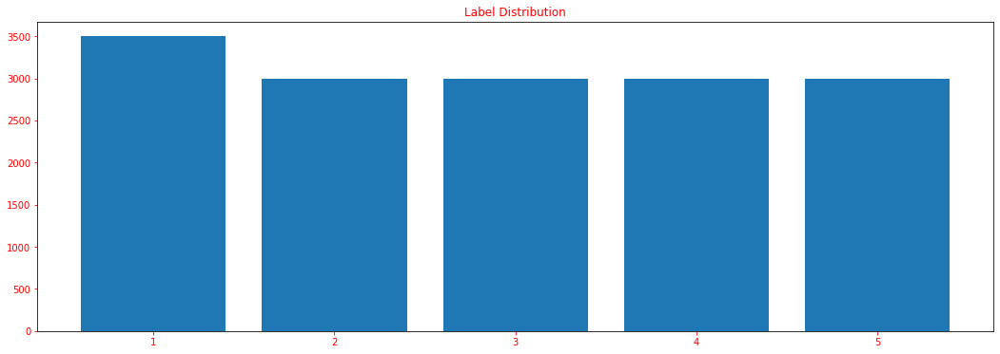

In [70]:
plt.figure(figsize = (18, 6))
plt.bar(*np.unique(train_df.label.values, return_counts = True))
plt.title('Label Distribution', color = 'red')
plt.tick_params(axis="x", colors="red")
plt.tick_params(axis="y", colors="red")
plt.show()

================================================== Label: 1 ==================================================


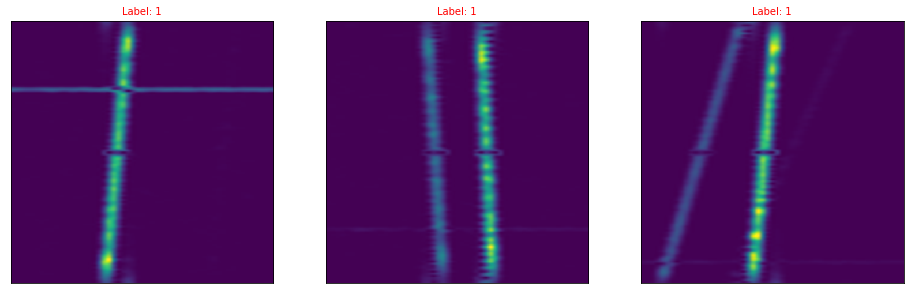

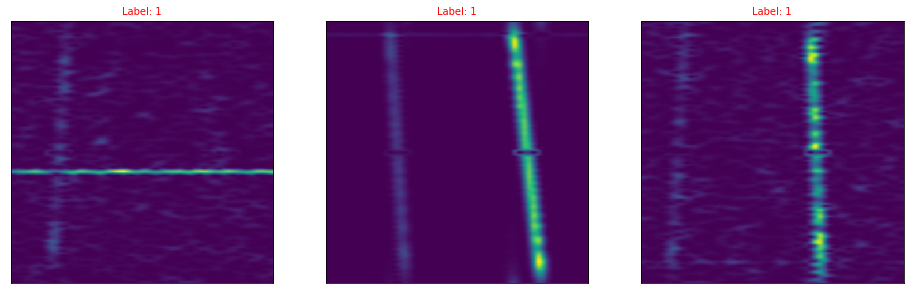

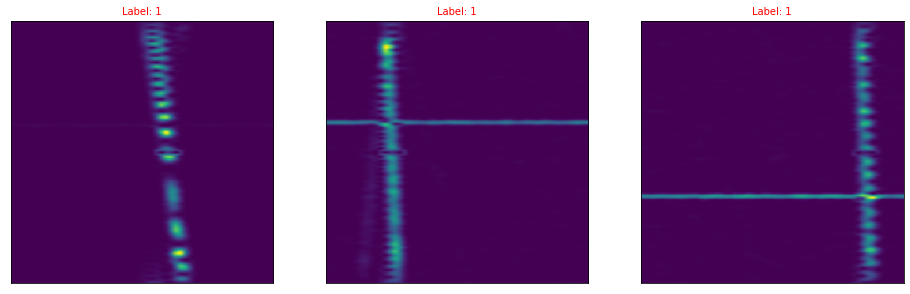

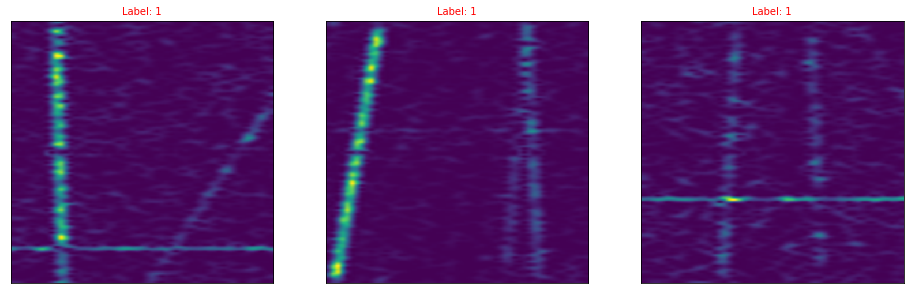

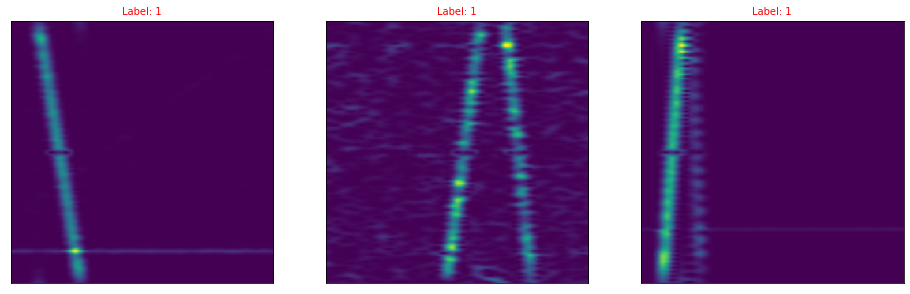

...

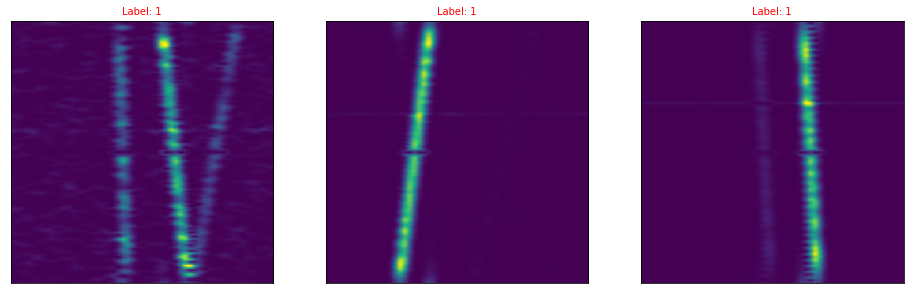

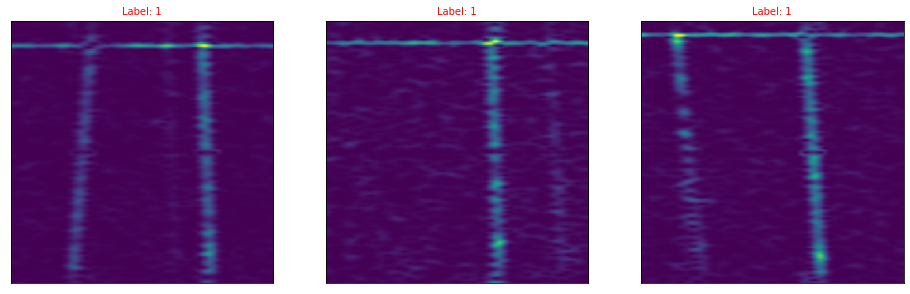

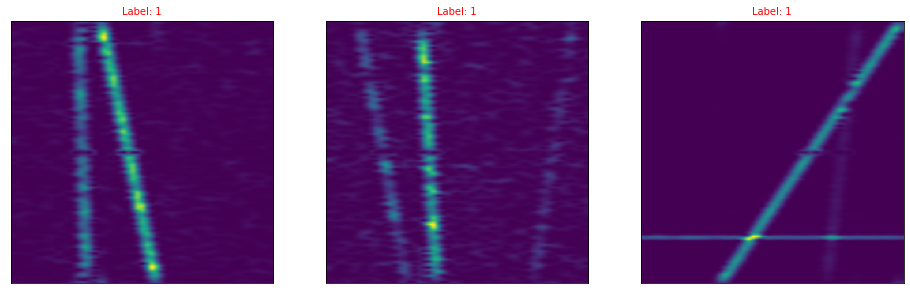

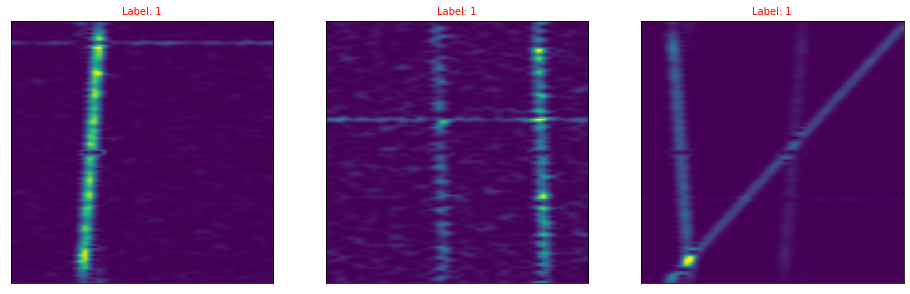

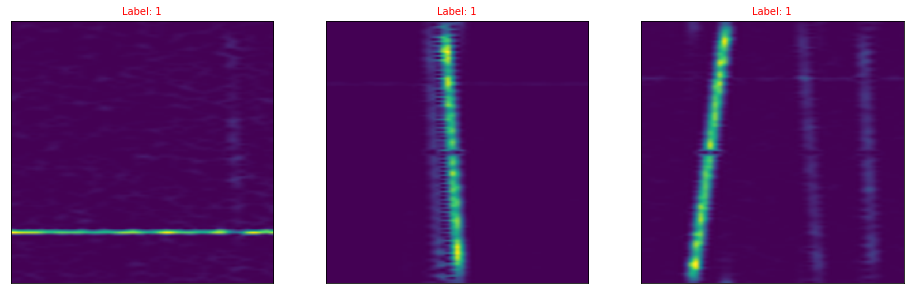







================================================== Label: 2 ==================================================


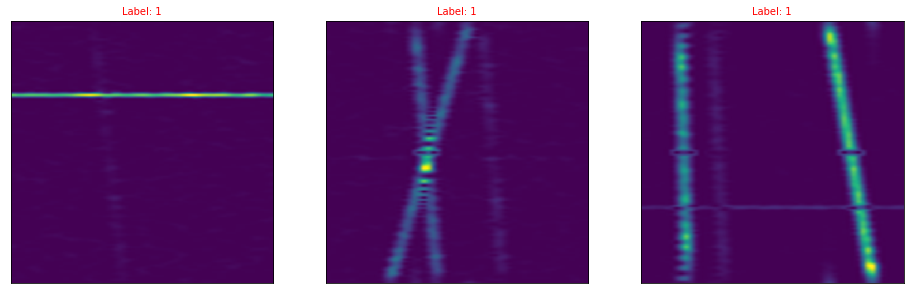

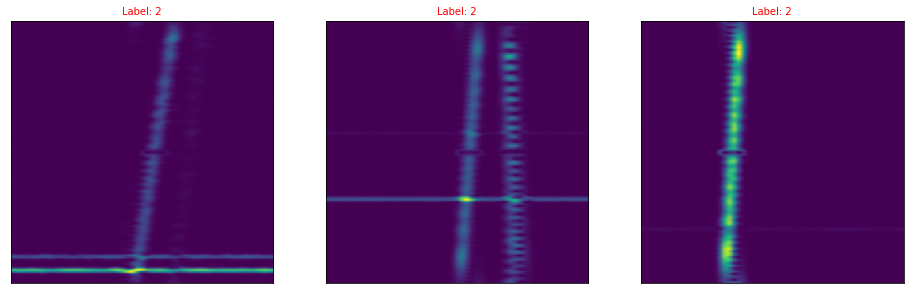

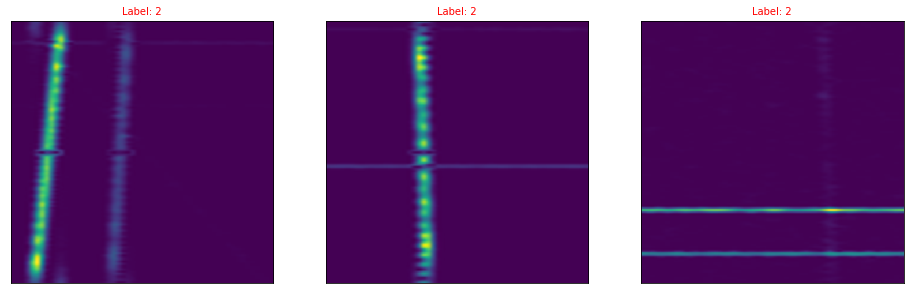

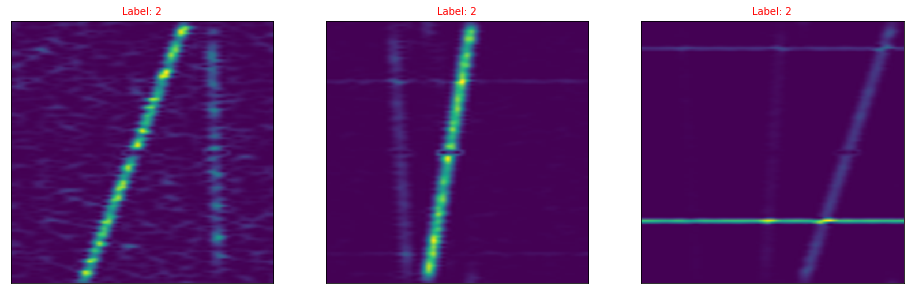

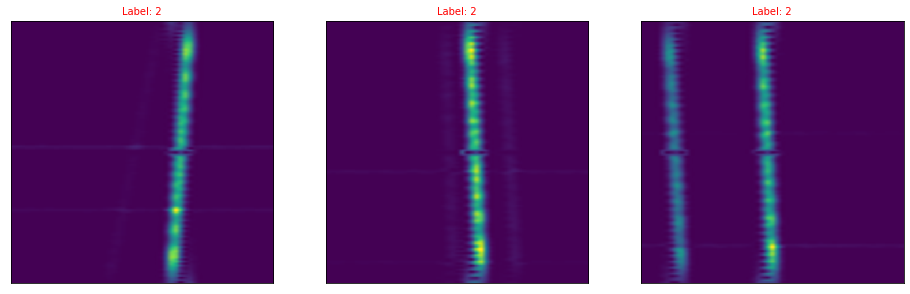

...

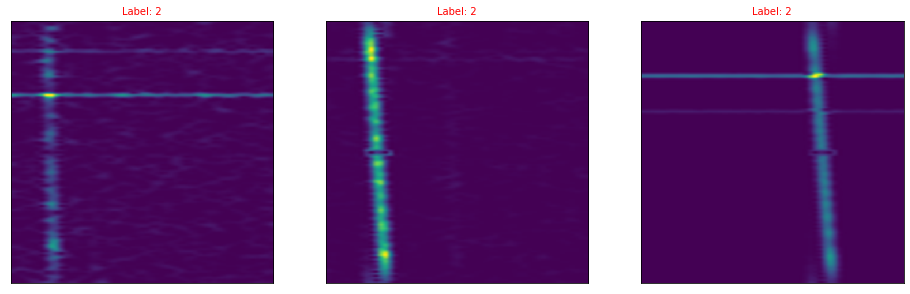

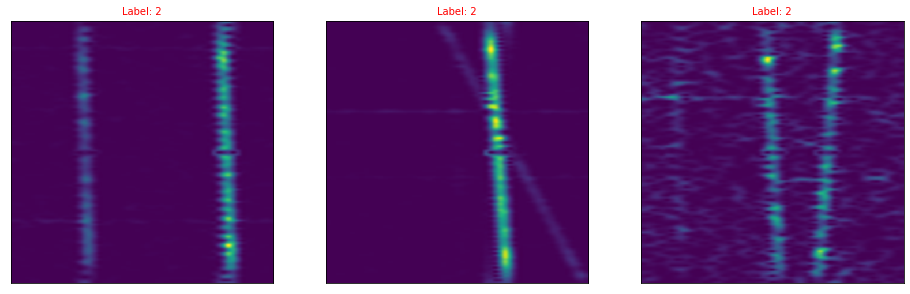

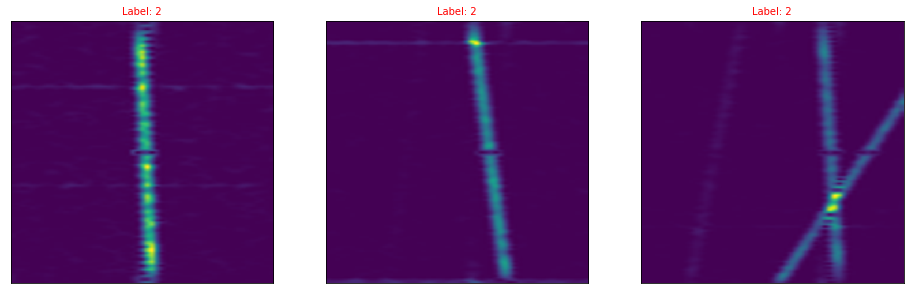

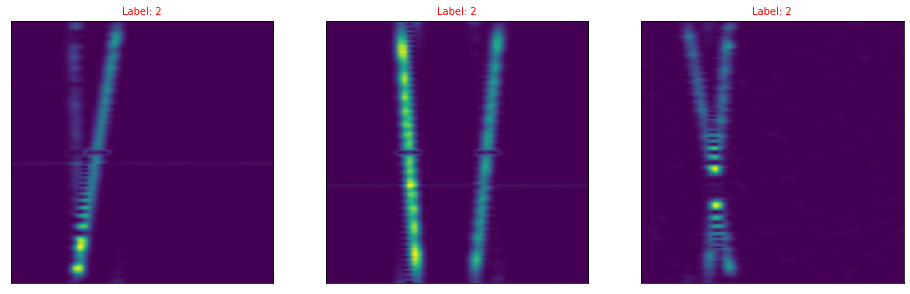

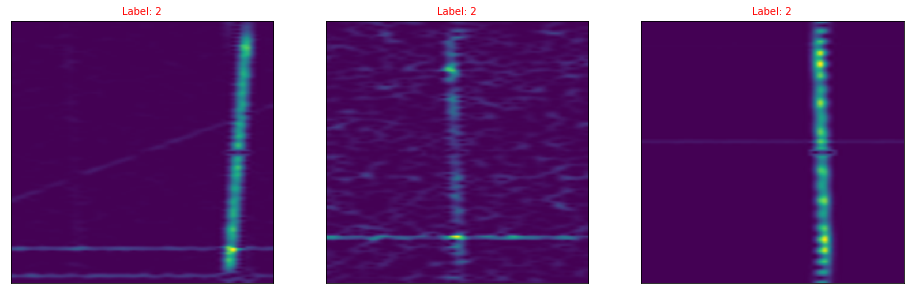







================================================== Label: 3 ==================================================


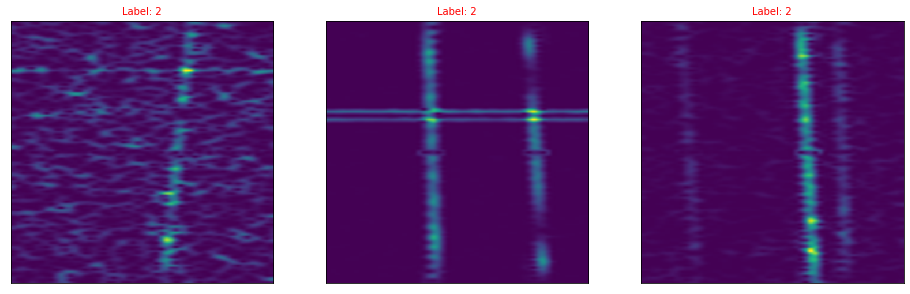

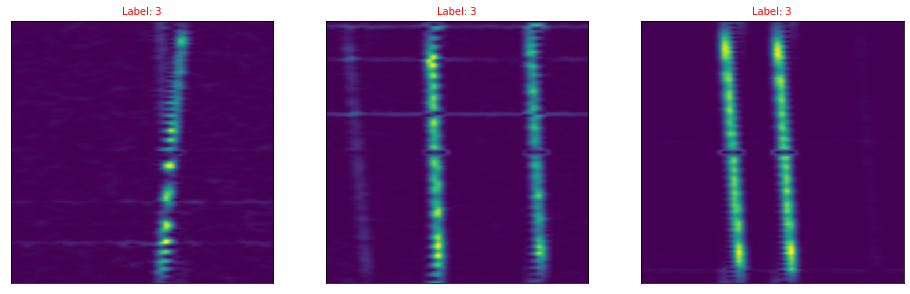

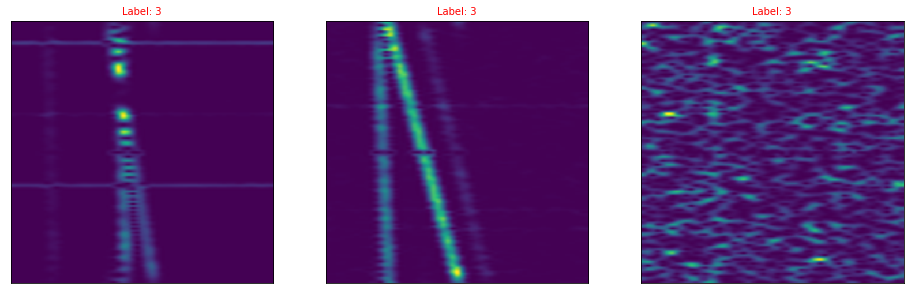

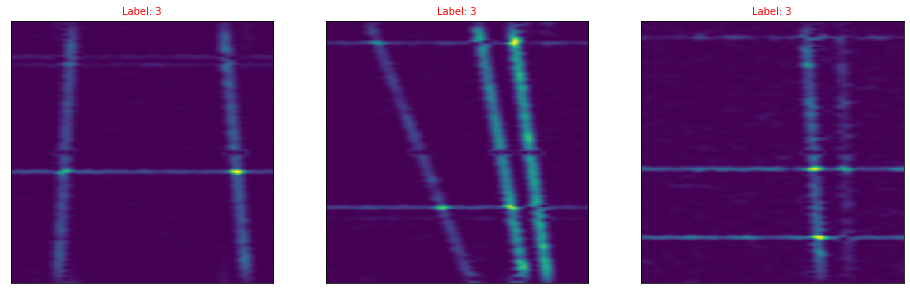

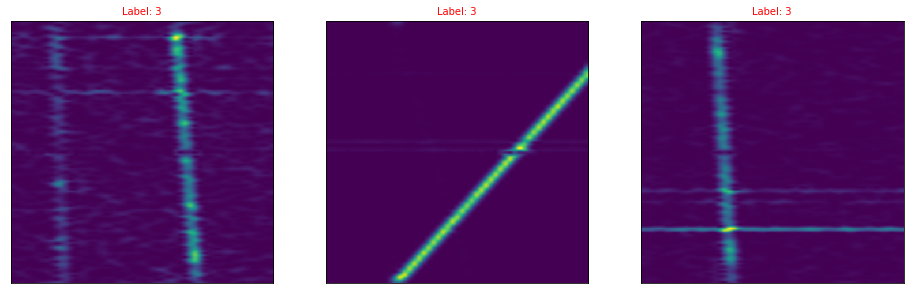

...

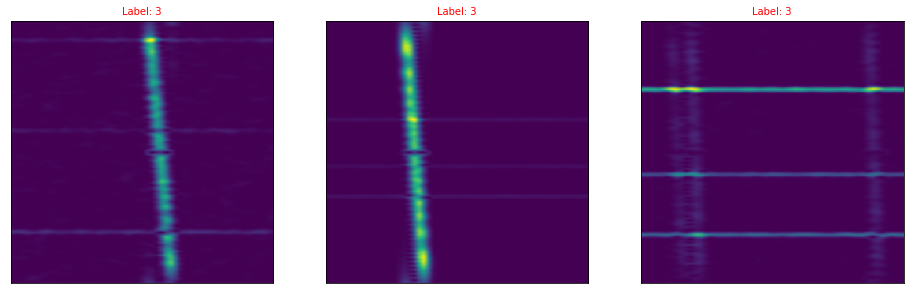

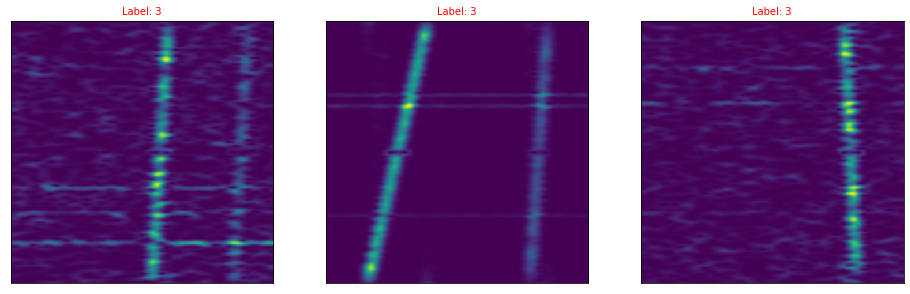

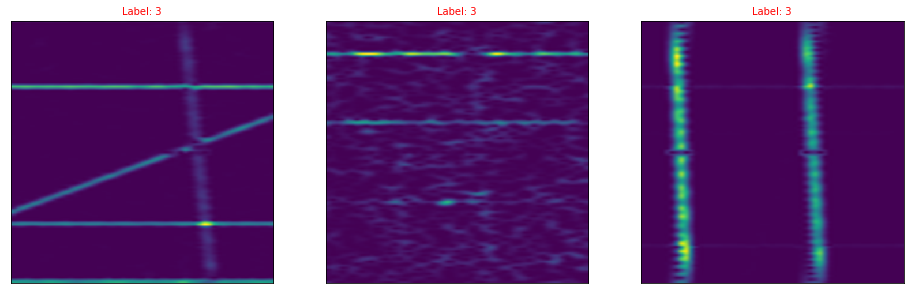

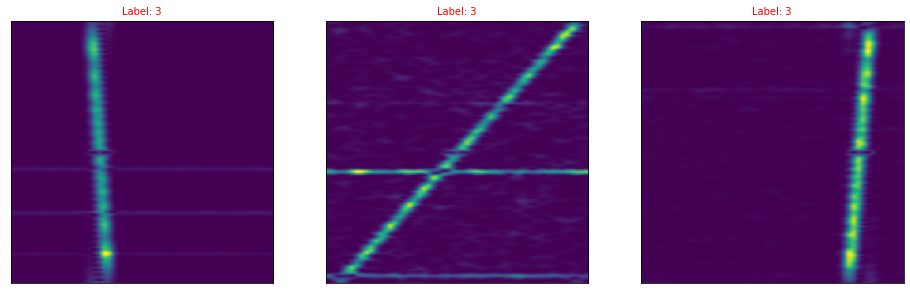

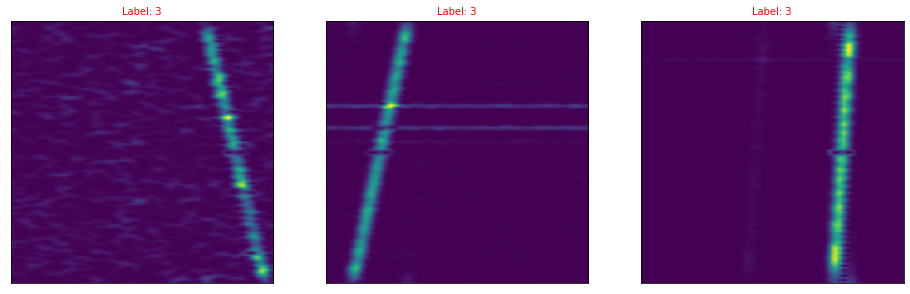







================================================== Label: 4 ==================================================


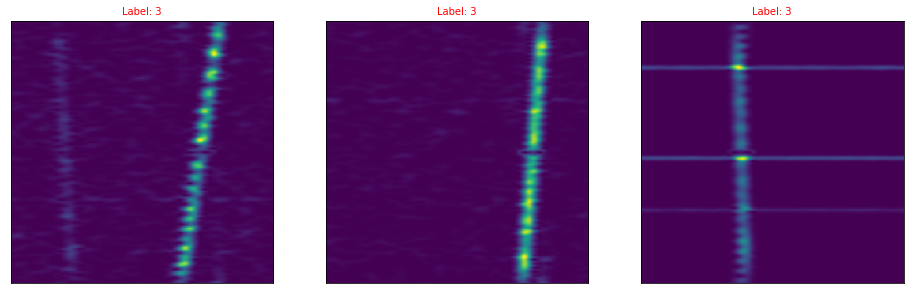

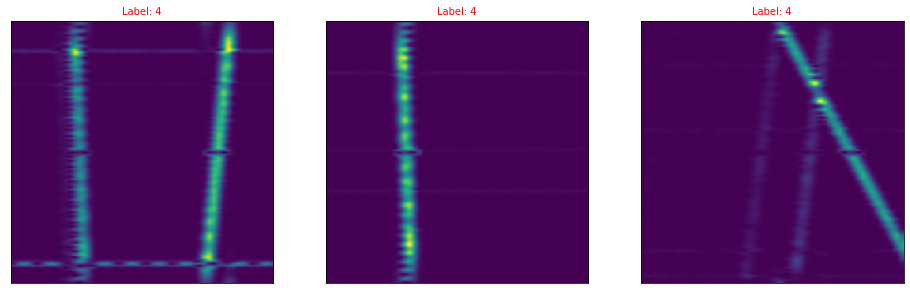

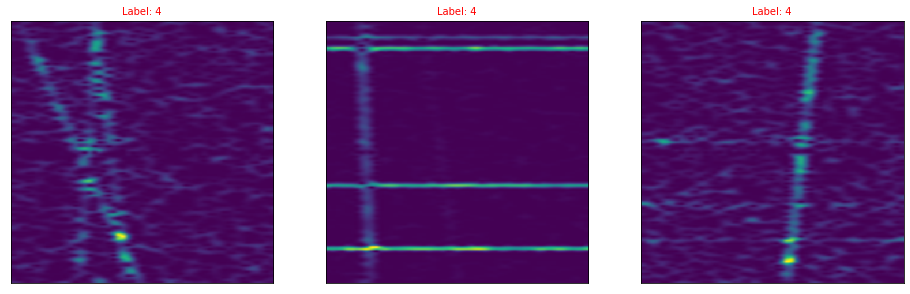

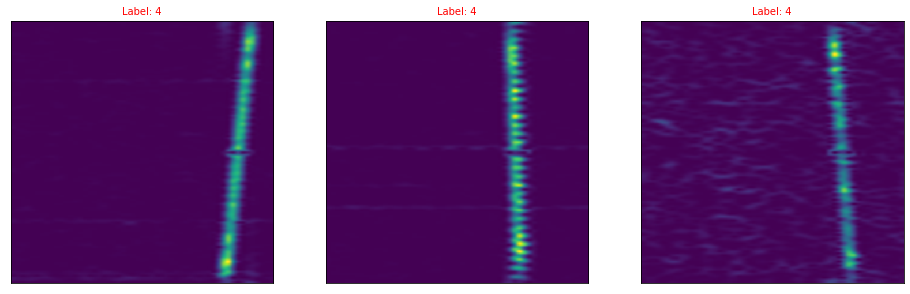

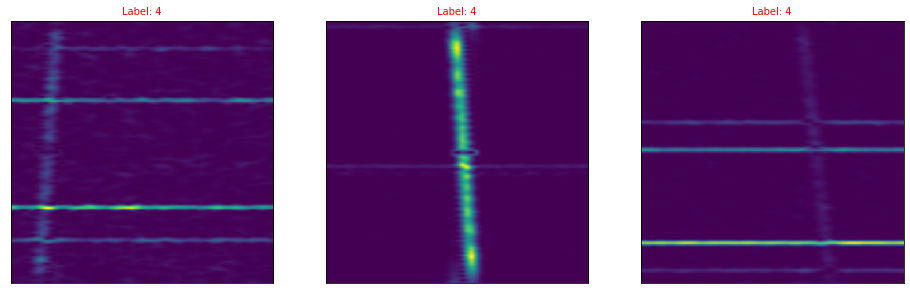

...

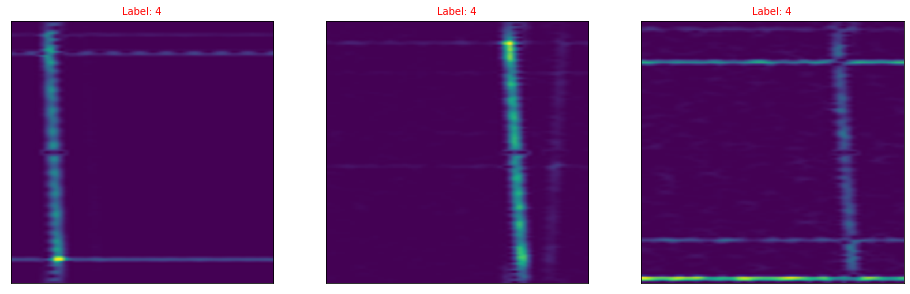

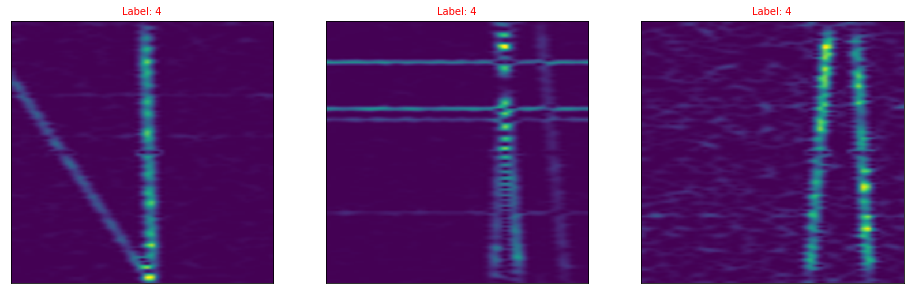

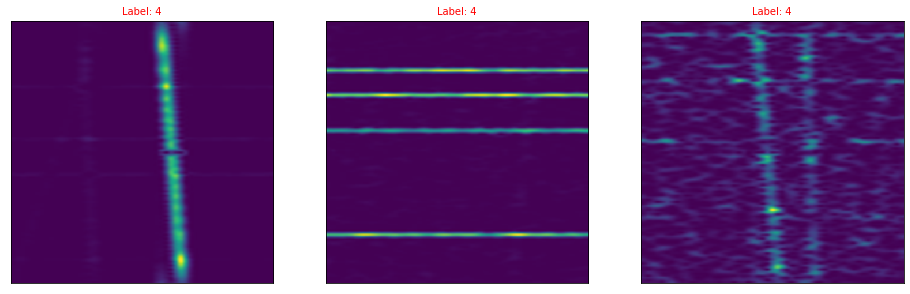

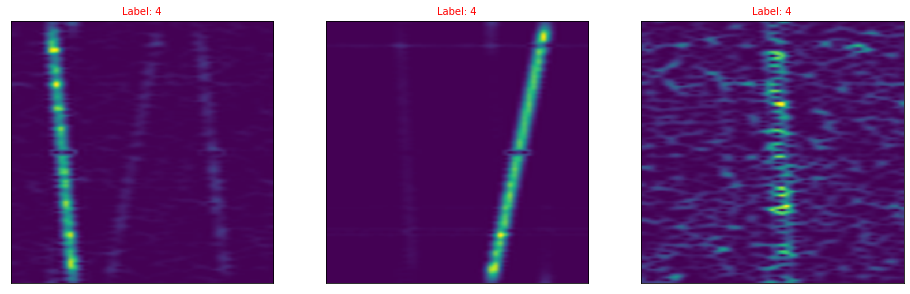

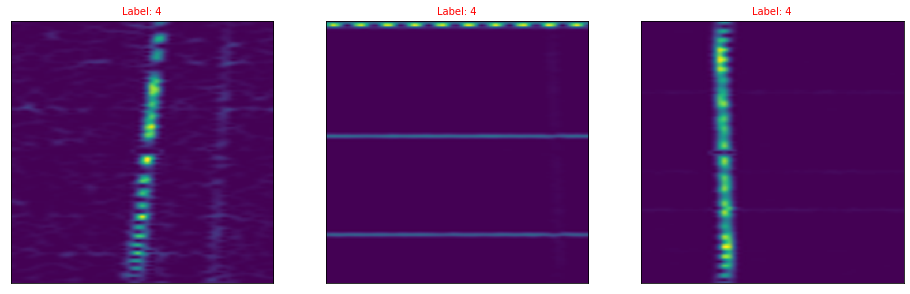







================================================== Label: 5 ==================================================


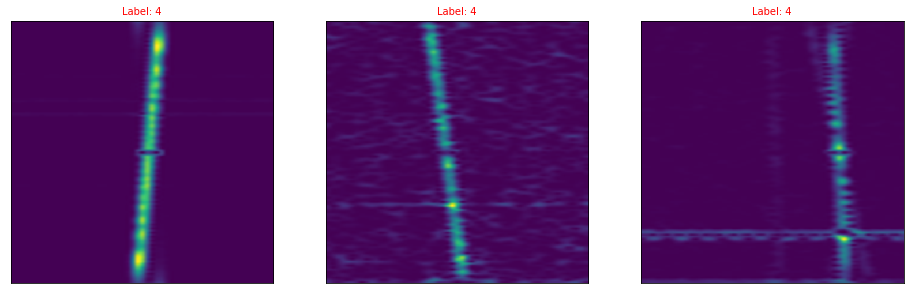

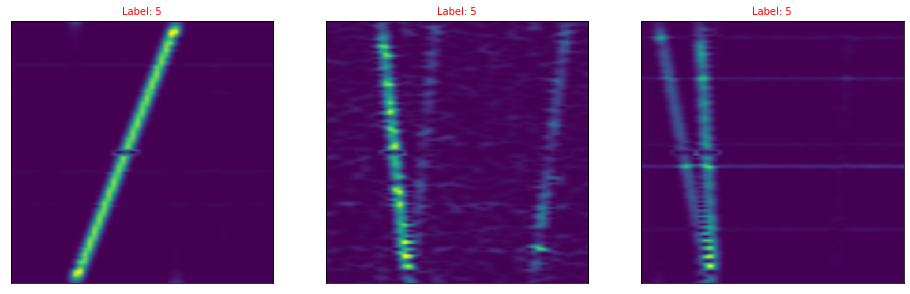

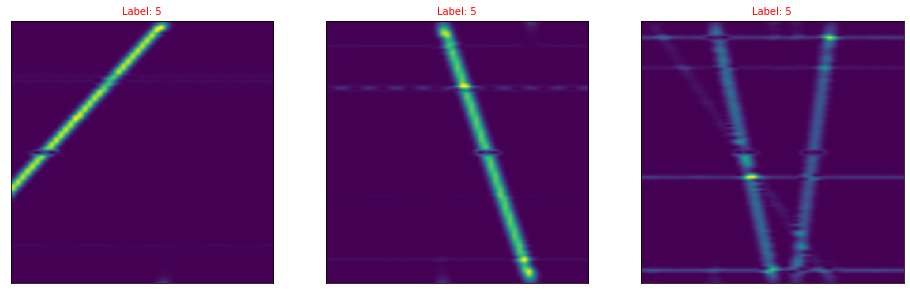

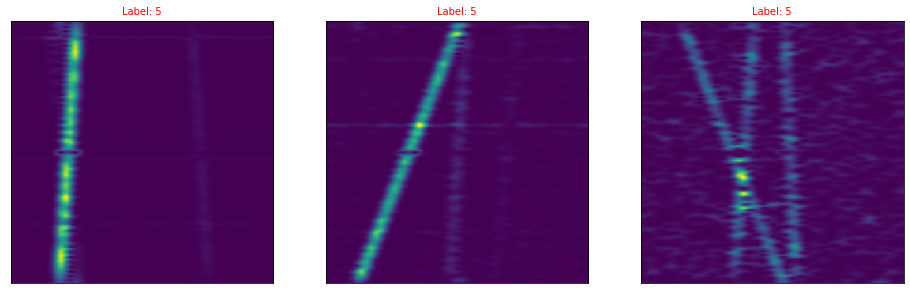

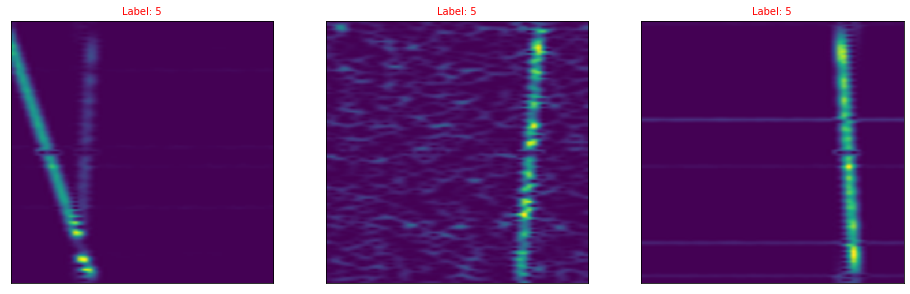

...

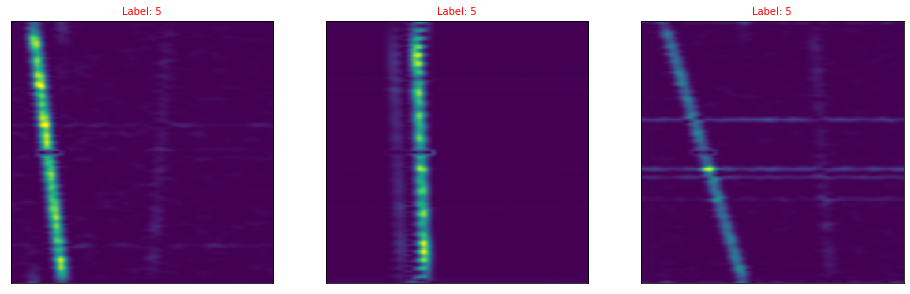

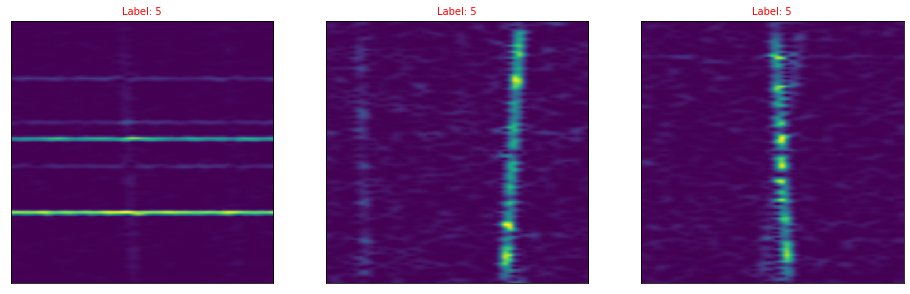

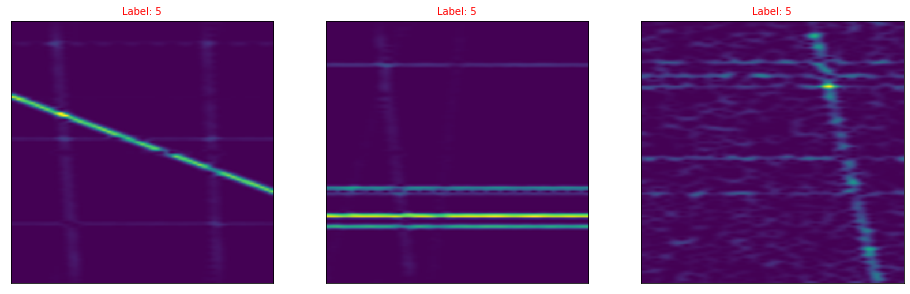

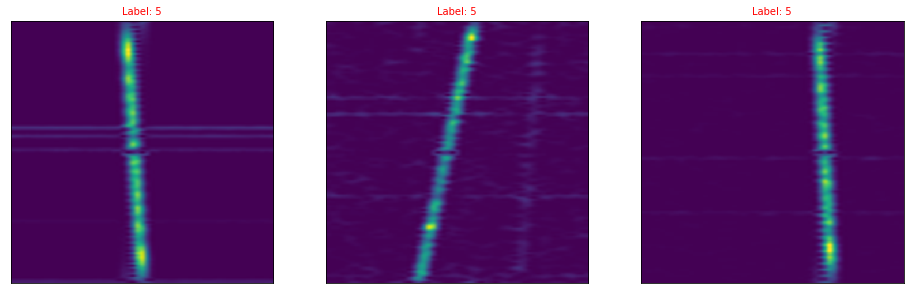

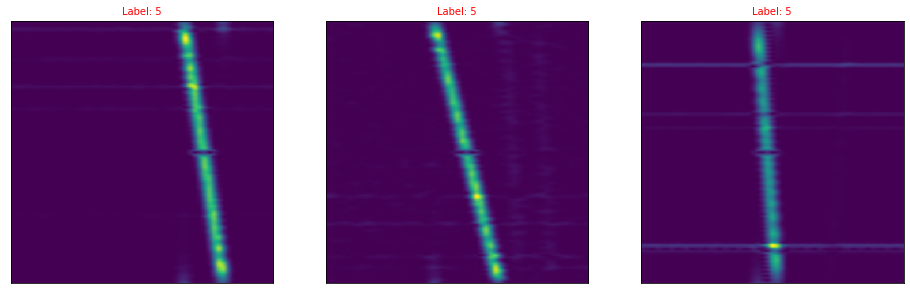

In [72]:
for group in train_df.groupby('label'):
    print(50 * '=' + f' Label: {group[0]} ' + 50 * '=')
    group_copy = group[1].reset_index(drop = True)
    plot_grid_images(group_copy, 20)
    print('\n\n\n\n\n')